# Data Loading

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from skimage.feature import hog
from google.colab import drive
drive.mount('/content/drive')

# Download the data stored in a zipped numpy array from one of these two locations
# The uncommented one is likely to be faster. If you're running all your experiments
# on a machine at home rather than using colab, then make sure you save it 
# rather than repeatedly downloading it.

!wget "https://sussex.box.com/shared/static/zlccr7uwq97y9cuexlilftdpmgudaz7u.npz" -O training_images_full.npz
!wget "https://sussex.box.com/shared/static/axweldiirenlc4a6xn06l6heiuawodpa.npz" -O training_images_subset.npz

# The test images (without points)
!wget "https://sussex.box.com/shared/static/2ss21w2g8nd8fshhtu9r2ww2mm04xh9f.npz" -O test_images.npz

# The example images are here
!wget "https://sussex.box.com/shared/static/65pyy3pjnkl5yda7ra4rvhcd89l6i7fq.npzz" -O examples.npz

def confirm_checksum(filename, true_checksum):
  import subprocess
  checksum = subprocess.check_output(['shasum',filename]).decode('utf-8')
  assert checksum.split(' ')[0] == true_checksum, 'Checksum does not match for ' + filename + ' redownload the data.'

confirm_checksum('training_images_full.npz', '69927c788396d4b8c05d33d1650b2aa66076c0f0')
confirm_checksum('training_images_subset.npz', '5e2690718c7b1a0d14db54f844e6e22453f5eb71')
confirm_checksum('test_images.npz', 'aed32f84664e906624c8af13b5462cbded13d539')
confirm_checksum('examples.npz', '2ea08d7b6d76b56de97325fe51daad72afaa3d73')

# Load the data using np.load
data = np.load('training_images_full.npz', allow_pickle=True)


##TRAINING DATA STUFF
# Extract the images
images = data['images']
# and the data points
pts = data['points']
##/TRAINING DATA STUFF

# Load the data that only has a subset of annotations using np.load
data_five_points = np.load('training_images_subset.npz', allow_pickle=True)

# Extract the images
images_subset = data_five_points['images']
# and the data points
pts_subset = data_five_points['points']


test_data = np.load('test_images.npz', allow_pickle=True)
test_images = test_data['images']


example_data = np.load('examples.npz', allow_pickle=True)
example_images = example_data['images']


print("done")

Mounted at /content/drive
--2023-05-09 14:10:06--  https://sussex.box.com/shared/static/zlccr7uwq97y9cuexlilftdpmgudaz7u.npz
Resolving sussex.box.com (sussex.box.com)... 74.112.186.144
Connecting to sussex.box.com (sussex.box.com)|74.112.186.144|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Cookie coming from sussex.box.com attempted to set domain to box.net
Location: /public/static/zlccr7uwq97y9cuexlilftdpmgudaz7u.npz [following]
--2023-05-09 14:10:06--  https://sussex.box.com/public/static/zlccr7uwq97y9cuexlilftdpmgudaz7u.npz
Reusing existing connection to sussex.box.com:443.
HTTP request sent, awaiting response... 301 Moved Permanently
Cookie coming from sussex.box.com attempted to set domain to box.net
Location: https://sussex.app.box.com/public/static/zlccr7uwq97y9cuexlilftdpmgudaz7u.npz [following]
--2023-05-09 14:10:06--  https://sussex.app.box.com/public/static/zlccr7uwq97y9cuexlilftdpmgudaz7u.npz
Resolving sussex.app.box.com (sussex.app.box.c

# Handy Functions

In [2]:
def extract_subset_of_points(pts):
  """
  Extracts a subset of five points from the full set of points provided.
  """
  indices = (20, 29, 16, 32, 38) # The indices of the points to extract
  if len(pts.shape) == 3: 
    return pts[:, indices, :] 
  elif len(pts.shape) == 2:
    return pts[indices, :] 

def euclid_dist(gt_pts, pred_pts):
  """
  Calculate the euclidean distance between pairs of points
  :param pred_pts: The predicted points
  :param gt_pts: The ground truth points
  :return: An array of shape (no_points,) containing the distance of each predicted point from the ground truth
  """
  import numpy as np
  pred_pts = np.reshape(pred_pts, (-1, 2))
  gt_pts = np.reshape(gt_pts, (-1, 2))
  return np.sqrt(np.sum(np.square(pred_pts - gt_pts), axis=-1))



def save_as_csv(points, location = '/content/drive/MyDrive/Colab Notebooks'):
    """
    Save the points out as a .csv file
    :param points: numpy array of shape (no_test_images, no_points, 2) to be saved
    :param location: Directory to save results.csv in. Default to current working directory
    """
 

    assert points.shape[0]==554, 'wrong number of image points, should be 554 test images'
    assert np.prod(points.shape[1:])==44*2, 'wrong number of points provided. There should be 44 points with 2 values (x,y) per point'
    np.savetxt(location + '/results.csv', np.reshape(points, (points.shape[0], -1)), delimiter=',')

def visualise_pts(img, pts, colour=None, point_colour='r', subplot=None, label=None):
    """
  visualise a set of points onto a face image
  :param img: the image the points correspond to
  :param pts: The set of points to draw into the face
  :param point_colour: The colour the points should be
  :param subplot: If the points want to be displayed as a subplot or not.
  """
    import matplotlib.pyplot as plt
    if subplot:
        plt.subplot(*subplot)
    plt.imshow(img, cmap=colour)
    plt.plot(pts[:, 0], pts[:, 1], marker='+', linestyle='', color=point_colour, ms=7, label=label)
    if not subplot:
        plt.show()


def pick_random_images(param_images, param_predicted_points, param_ground_points, quantity):
  """
  Picks a specified number of random images and shows both their ground truth and predicted points.
  :param param_images: a list of images that the images will be picked from
  :param param_predicted_points: a list of predicted points for param_images
  :param_ground_points: a list of the ground points for param_images
  :quantity: the number of images that would like to be chosen.
  """

  for i in range(quantity):
    idx = np.random.randint(0, 256)
    visualise_pts(param_images[idx], param_ground_points[idx], colour="gray", point_colour="r", subplot=(1, 2, 1))
    plt.title("Ground Truth")
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
  
    visualise_pts(param_images[idx], param_predicted_points[idx], colour="gray", point_colour="b", subplot=(1, 2, 2))
    plt.title("Prediction")
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.show()


          
def plot_best_and_worst(grounds,predicts,images):
  """
  readies the best and worst predictions throughout the dataset to be displayed in a subplot.  
  :param grounds: the ground truth points for the list
  :param predicts: the predicted points for the list
  :param images: the images which correpsond to the points within the list
  """

  plt.figure(figsize=(10,10))
  means = []
  for i in range(len(grounds)):
    means.append(np.mean(euclid_dist(grounds[i],predicts[i])))
  overall_mean = np.mean(means)

  best_dist = min(means)
  worst_dist = max(means)

  best_index = means.index(best_dist)
  worst_index = means.index(worst_dist)

  visualise_pts(images[worst_index], predicts[worst_index], colour="gray", point_colour="r", subplot=(1, 2, 1), label="Predictions")
  visualise_pts(images[worst_index], grounds[worst_index], colour="gray", point_colour="w", subplot=(1, 2, 1), label="Ground Truth")
  w_title = "Worst: "+ str(worst_dist) + " pixels."
  plt.title(w_title)
  plt.legend(loc="upper left")
  ax = plt.gca()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  
  visualise_pts(images[best_index], predicts[best_index], colour="gray", point_colour="g", subplot=(1, 2, 2), label="Predictions")
  visualise_pts(images[best_index], grounds[best_index], colour="gray", point_colour="w", subplot=(1, 2, 2), label="Ground Truth")
  b_title = "Best: "+ str(best_dist) + " pixels."
  plt.title(b_title)
  plt.legend(loc="upper left")
  ax = plt.gca()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)

  
  plt.figure(figsize=(6, 4))
  plt.title("Histogram of Mean Euclidean Distances.")
  plt.axvline(x = overall_mean, color = 'r', label = 'Mean Line')
  plt.legend(loc="upper right")
  plt.hist(means, density=True)


  plt.show()


def find_mean_euclid_dist(grounds, predicts, preprocess_scale):
  """
  finds the mean mean euclidian distance for all images within a list of predicted points  
  :param grounds: the ground truth points for the list
  :param predicts: the predicted points for the list
  :preprocess_scale: the scalar at which to multiply the mean, if the images and points have been resized
  :return: the mean of the set of mean euclidian distances calculated from all images within grounds/predicts
  """

  means = []
  for i in range(len(grounds)):
    means.append(np.mean(euclid_dist(grounds[i], predicts[i])))
  full_set_average = np.mean(means) / preprocess_scale
  return full_set_average


def do_hog(image, hog_orientations, hog_size):
  features, hogged_image = hog(image, orientations=hog_orientations, pixels_per_cell=(hog_size,hog_size), visualize=True)
  return features, hogged_image

# Pre-Processing functions




Proprocess training images and split into training and validation images

In [3]:
def preprocess_training_and_validation_data(image_size, gaussian_kernel_size):
  """
  Preprocesses training and validation data, including resizing, grayscale conversion, histogram equalization, and Gaussian blurring.

  :param image_size: The size to which all images in the dataset will be resized. Must be an integer.
  :param gaussian_kernel_size: The size of the kernel used for Gaussian blurring. Must be an odd integer.
  :return: A tuple containing the preprocessed training images, validation images, training points, validation points,
  and the scale factor used for preprocessing.
  """



  #resize images
  images_resized = []
  target_size = (image_size,image_size)
  image_scale = image_size/len(images[0])
  print("preprocessing training & validation Data with scale",image_scale)

  # scale all points to match image size
  scaled_pts = pts * image_scale

  for image in images:
    res = cv2.resize(image, dsize=target_size, interpolation=cv2.INTER_CUBIC)
    images_resized.append(res)

  #apply greyscale and histogram equalisation to images
  train_images_equalised = []
  for image in images_resized:
   image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
   hist_eq_img = cv2.equalizeHist(image_grey)
   train_images_equalised.append(hist_eq_img)

  #apply gaussian blur to images
  train_images_gaussian = []
  for image in train_images_equalised:
   train_images_gaussian.append(cv2.GaussianBlur(image, (gaussian_kernel_size, gaussian_kernel_size), 0))

   ##create list of training data and validation data at a 8:2 ratio.
  training_images, validation_images, training_pts, validation_pts =  train_test_split(train_images_gaussian,scaled_pts, test_size=0.2, shuffle=True)

  return(training_images, validation_images, training_pts, validation_pts, image_scale)




def preprocess_testing_images(image_size, gaussian_kernel_size):
  
  """
  Preprocesses testing images by resizing them, applying greyscale and histogram equalization, and then applying a Gaussian blur.

  :param image_size: The desired size (in pixels) of each image after resizing. must be an integer
  :param gaussian_kernel_size: The size of the Gaussian kernel to use for blurring each image. must be an odd integer
  :return: A list of preprocessed testing images, where each image has gone through the following steps: resizing, greyscale conversion, histogram equalization, and Gaussian blurring.
  """

  #resize test images
  test_images_resized = []
  target_size = (image_size,image_size)
  for image in test_images:
    res = cv2.resize(image, dsize=target_size, interpolation=cv2.INTER_CUBIC)
    test_images_resized.append(res)

# apply greyscale and histogram equalization to resized images
  test_images_equalised = []
  for image in test_images_resized:
    image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hist_eq_img = cv2.equalizeHist(image_grey)
    test_images_equalised.append(hist_eq_img)

#apply gaussian blur to equalised images
  test_images_gaussian = []
  for image in test_images_equalised:
   test_images_gaussian.append(cv2.GaussianBlur(image, (gaussian_kernel_size, gaussian_kernel_size), 0))

  return test_images_gaussian



def preprocess_example_images(image_size, gaussian_kernel_size):
  """
  Preprocesses example images by resizing them, applying greyscale and histogram equalization, and then applying a Gaussian blur.

  :param image_size: The desired size (in pixels) of each image after resizing. Must be an integer.
  :param gaussian_kernel_size: The size of the Gaussian kernel to use for blurring each image. Must be an odd integer.
  :return: The list of preprocessed example images, where each image has gone through the following steps: resizing, greyscale conversion, histogram equalization, and Gaussian blurring.
  """
  
  #resize eample images
  example_images_resized = []
  target_size = (image_size,image_size)
  for image in example_images:
    res = cv2.resize(image, dsize=target_size, interpolation=cv2.INTER_CUBIC)
    example_images_resized.append(res)

  #apply greyscale and histogram equalisation to resized images
  example_images_equalised = []
  for image in example_images_resized:
    image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    hist_eq_img = cv2.equalizeHist(image_grey)
    example_images_equalised.append(hist_eq_img)

  #apply gaussian blur to greyscaled images.
  example_images_gaussian = []
  for image in example_images_equalised:
   example_images_gaussian.append(cv2.GaussianBlur(image, (gaussian_kernel_size, gaussian_kernel_size), 0))

  return example_images_gaussian

In [4]:
def single_experiment(image_size, gaussian_blur_size, hog_orientations, hog_size, regressor_alpha):
  """
  Performs a single experiment by training a ridge regressor on preprocessed images and their corresponding landmark coordinates
  :param image_size: The size to scale all images during preprocessing
  :param gaussian_blur_size: the gaussian blur kernel size to use
  :param hog_orientations: the number of orientations to be calculated by HOG
  :param hog_size: the cell size that each HOG point should use.
  :param regressor_alpha: regularisation strength of the ridge regressor
  :returns: the mean of all mean euclidean distances of the regressor's predicted points and the ground truth points. 
  """


 # Preprocess images uding preprocessing function
  preprocessed_training_images, preprocessed_validation_images, preprocessed_training_points, preprocessed_validation_pts, process_scale = preprocess_training_and_validation_data(image_size, gaussian_blur_size)

  print("preprocessing done...")
  #Get Hogs of training and validation Data
  training_hogs = [do_hog(image, hog_orientations, hog_size)[0] for image in preprocessed_training_images]
  validation_hogs = [do_hog(image, hog_orientations, hog_size)[0] for image in preprocessed_validation_images]
  print("HOGs calculated")
  #reshaping coords to be a 2D array instead of 3D
  n_samples_pts, n_points, n_coords = preprocessed_training_points.shape
  training_pts_flat = np.reshape(preprocessed_training_points, (n_samples_pts, n_points * n_coords))
  
  #create ridge regressor
  ridge_regressor = Ridge(alpha=regressor_alpha)
  #fit regressor to training data
  ridge_regressor.fit(training_hogs, training_pts_flat)

  #create validation set coord predictions from hog
  validation_predictions_flat = ridge_regressor.predict(np.array(validation_hogs))
  #reshape validation predictions to be 3d for coords
  validation_predictions = np.reshape(validation_predictions_flat, (-1, n_points, n_coords))
  #display 2 random images
  pick_random_images(param_images=preprocessed_validation_images, param_predicted_points=validation_predictions,param_ground_points=preprocessed_validation_pts, quantity=2)

  #find euclidean distance of all points
  mean_distance = find_mean_euclid_dist(grounds=preprocessed_validation_pts, predicts=validation_predictions, preprocess_scale=process_scale)
  print("Parameters...","\nImage size:", image_size,"\nGaussian blur size:", gaussian_blur_size,"\nHog orientation size:", hog_orientations,"\nHog kernel size:", hog_size,"\nRegressor alpha:", regressor_alpha, "\nMean Euclidian Distance:", mean_distance)
  return mean_distance

def multiple_experiments(parameters_list):
  """Runs multiple experiments with different combinations of parameters and returns a list of mean distances for each experiment.
  :param parameters_list: a list of parameter combinations, where each combination is represented as a list of 5 elements: [image_size, gaussian_blur_size, hog_orientations, hog_size, regressor_alpha]
  :returns: a list of mean distances for each experiment.
  """

  mean_list = []

  #do experiment for all parameters within parameter list 
  for params in parameters_list:
    mean_list.append(single_experiment(params[0],params[1],params[2],params[3],params[4]))
  print("list of means:",mean_list)
  return mean_list



def predict_test_images(image_size, gaussian_blur_size, hog_orientations, hog_size, regressor_alpha, examples=False):
  """
  Generates predictions for a set of test images using a Ridge regression model trained on preprocessed training data.

  :param image_size: an integer representing the size of the square images to use for training and prediction.
  :param gaussian_blur_size: an integer representing the size of the Gaussian blur to apply to the images before processing.
  :param hog_orientations: an integer representing the number of orientations to use for computing HOG features.
  :param hog_size: an integer representing the size of the HOG cells.
  :param regressor_alpha: a float representing the regularization strength of the Ridge regression model.
  :param examples: a boolean indicating whether to generate predictions for example images or testing images.
  :return: if `examples` is True, returns None and displays a plot of the predicted points on the example images.
           If `examples` is False, returns None and displays a plot of the predicted points on the testing images.
  """



  if examples:
    preprocessed_example_images = preprocess_example_images(image_size, gaussian_blur_size)
  else: 
    preprocessed_testing_images = preprocess_testing_images(image_size, gaussian_blur_size)

  preprocessed_training_images, preprocessed_validation_images, preprocessed_training_points, preprocessed_validation_pts, process_scale = preprocess_training_and_validation_data(image_size, gaussian_blur_size)

  #Get Hogs of training and testing images
  training_hogs = [do_hog(image, hog_orientations, hog_size)[0] for image in preprocessed_training_images]
  if examples:
    example_hogs = [do_hog(image, hog_orientations, hog_size)[0] for image in preprocessed_example_images]
  else:
    testing_hogs = [do_hog(image, hog_orientations, hog_size)[0] for image in preprocessed_testing_images]


  #reshaping coords to be a 2D array instead of 3D
  n_samples_pts, n_points, n_coords = preprocessed_training_points.shape
  training_pts_flat = np.reshape(preprocessed_training_points, (n_samples_pts, n_points * n_coords))

  #create ridge regressor
  ridge_regressor = Ridge(alpha=regressor_alpha)
  #fit regressor to training data
  ridge_regressor.fit(training_hogs, training_pts_flat)

  #create validation set coord predictions from hog
  if examples: 
    example_predictions_flat = ridge_regressor.predict(np.array(example_hogs))
  else:
    testing_predictions_flat = ridge_regressor.predict(np.array(testing_hogs))
  
  #reshape validation predictions to be 3d for coords
  if examples: 
    example_predictions = np.reshape(example_predictions_flat, (-1, n_points, n_coords))
  else:
    testing_predictions = np.reshape(testing_predictions_flat, (-1, n_points, n_coords))

  if examples:
    for i in range(len(example_predictions)):  
      visualise_pts(example_images[i], example_predictions[i], colour="gray", point_colour="r", subplot=(1, 2, 1))
      plt.title("Example prediction")
      ax = plt.gca()
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)
      plt.show()
  else:
   for i in range(len(testing_predictions)):  
    visualise_pts(test_images[i], testing_predictions[i], colour="gray", point_colour="r", subplot=(1, 2, 1))
    plt.title("Testing prediction")
    ax = plt.gca()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
    plt.show()



preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


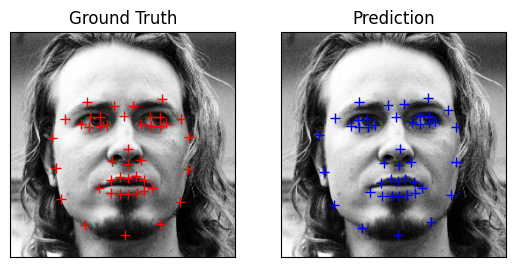

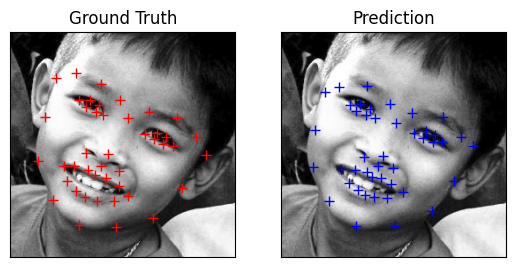

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 11 
Mean Euclidian Distance: 5.893177680236901
preprocessing training & validation Data with scale 0.5
preprocessing done...
HOGs calculated


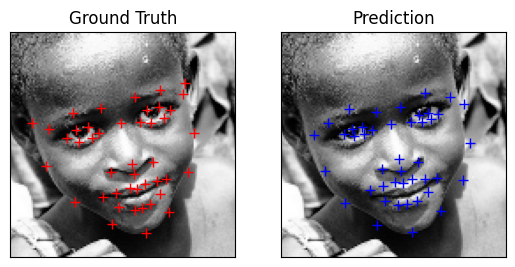

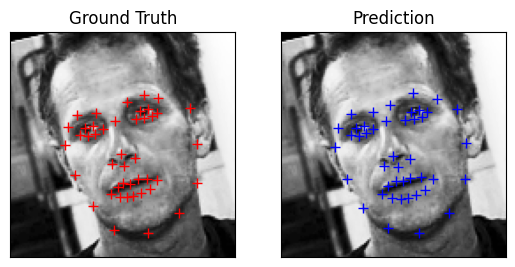

Parameters... 
Image size: 128 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 5.968166292650929
preprocessing training & validation Data with scale 0.375
preprocessing done...
HOGs calculated


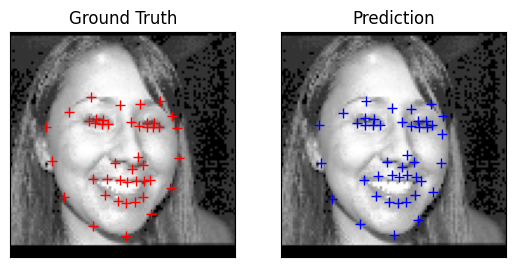

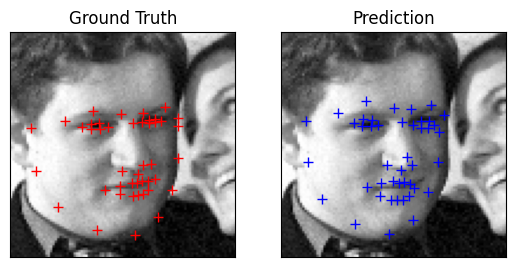

Parameters... 
Image size: 96 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 6.530314043071104
preprocessing training & validation Data with scale 0.25
preprocessing done...
HOGs calculated


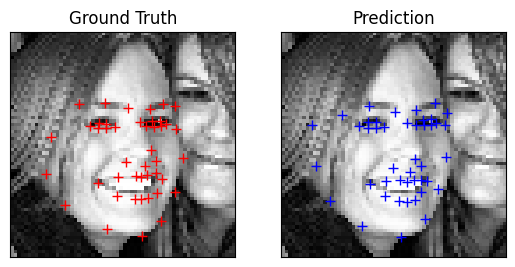

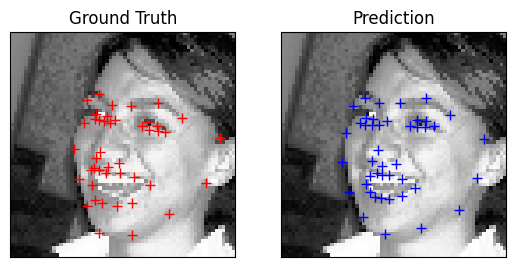

Parameters... 
Image size: 64 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 8 
Regressor alpha: 11 
Mean Euclidian Distance: 6.487291793363718
preprocessing training & validation Data with scale 0.1875
preprocessing done...
HOGs calculated


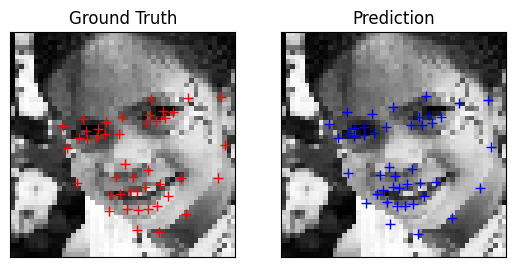

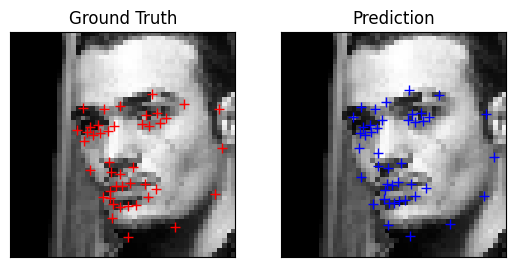

Parameters... 
Image size: 48 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 6 
Regressor alpha: 11 
Mean Euclidian Distance: 6.746282655356398
preprocessing training & validation Data with scale 0.125
preprocessing done...
HOGs calculated


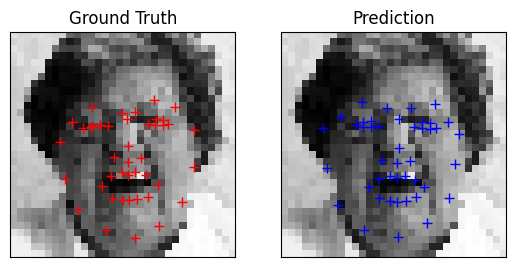

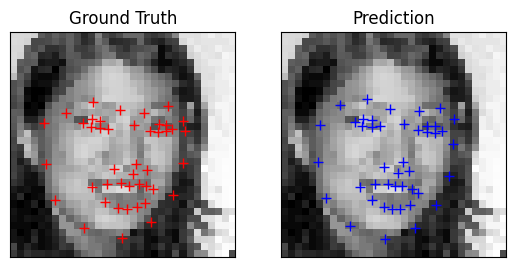

Parameters... 
Image size: 32 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 4 
Regressor alpha: 11 
Mean Euclidian Distance: 7.793601437533681
preprocessing training & validation Data with scale 0.0625
preprocessing done...
HOGs calculated


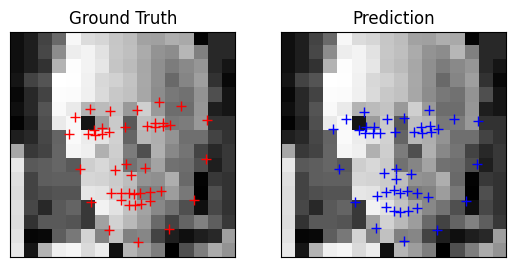

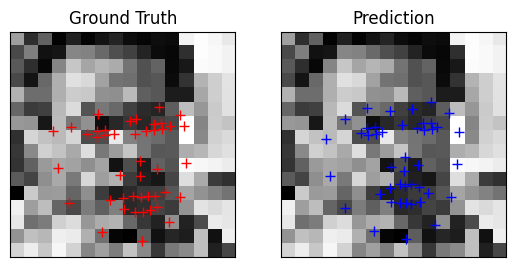

Parameters... 
Image size: 16 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 2 
Regressor alpha: 11 
Mean Euclidian Distance: 10.167326655632246
list of means: [5.893177680236901, 5.968166292650929, 6.530314043071104, 6.487291793363718, 6.746282655356398, 7.793601437533681, 10.167326655632246]


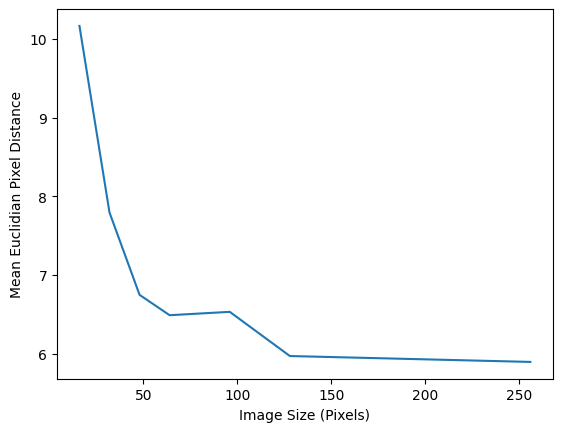

In [ ]:
##trying different image sizes
parameters = [[256,1,8,32,11],[128,1,8,16,11],[96,1,8,16,11],[64,1,8,8,11],[48,1,8,6,11],[32,1,8,4,11],[16,1,8,2,11]]
independent_variable = [parameter[0] for parameter in parameters]

dependent_variable = multiple_experiments(parameters)


plt.plot(independent_variable, dependent_variable) 
plt.xlabel("Image Size (Pixels)")
plt.ylabel("Mean Euclidian Pixel Distance")

plt.show()

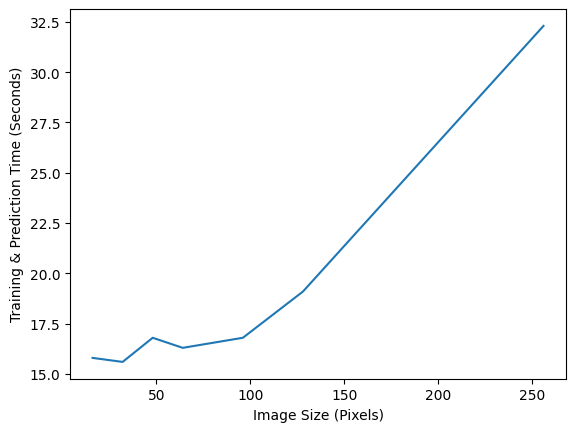

In [ ]:
#timings were measured using a stopwatch
times = [32.3,19.1,16.8,16.3,16.8,15.6,15.8]
sizes = [256,128,96,64,48,32,16]
plt.xlabel("Image Size (Pixels)")
plt.ylabel("Training & Prediction Time (Seconds)")

plt.plot(sizes, times)

preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


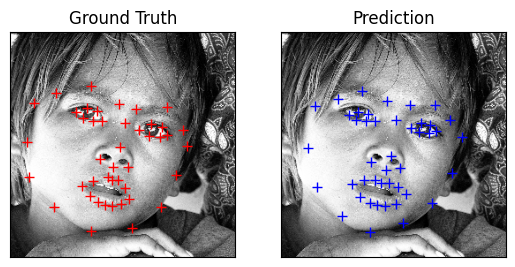

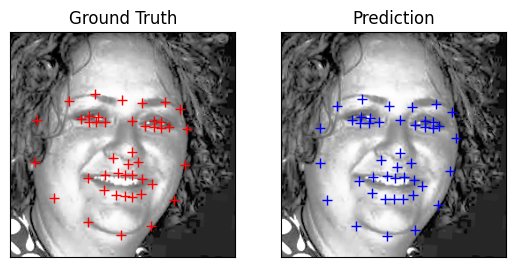

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 6.062685324510649
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


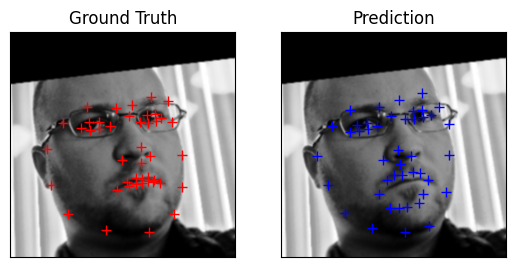

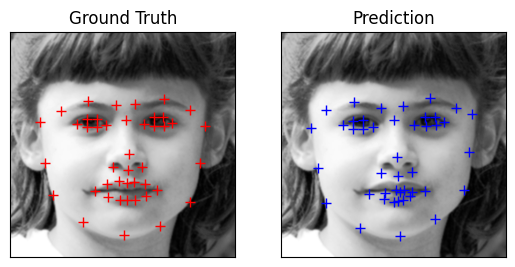

Parameters... 
Image size: 256 
Haussian blur size: 3 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 1 
Mean Euclidian Distance: 6.891943474137444
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


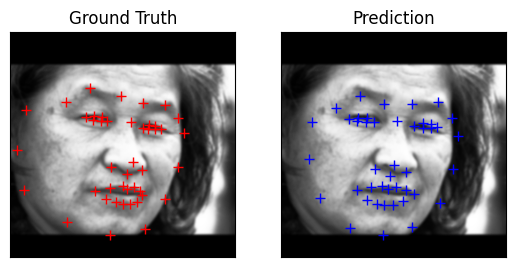

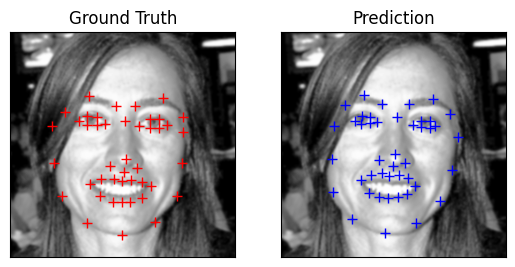

Parameters... 
Image size: 256 
Haussian blur size: 5 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 5.977217451531367
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


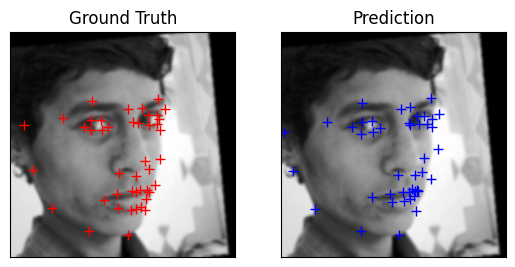

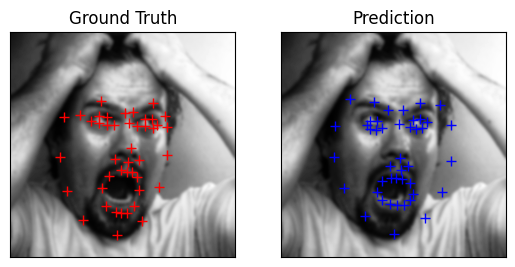

Parameters... 
Image size: 256 
Haussian blur size: 7 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 1 
Mean Euclidian Distance: 7.042082330669301
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


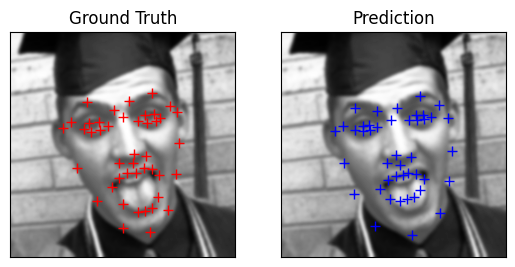

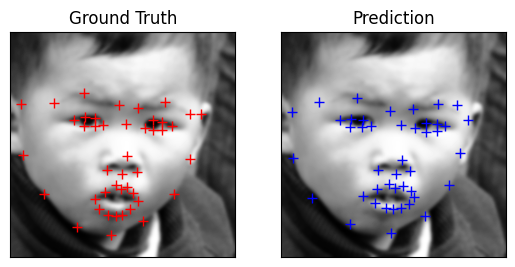

Parameters... 
Image size: 256 
Haussian blur size: 9 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 6.226814215449626
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


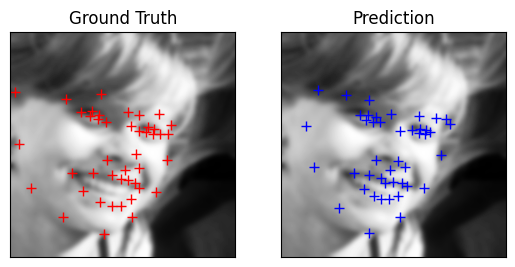

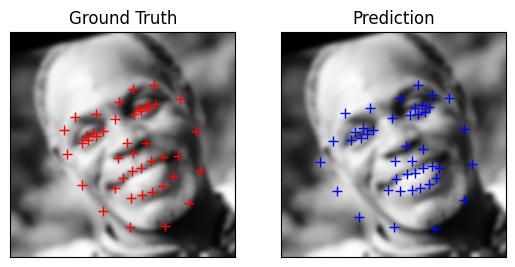

Parameters... 
Image size: 256 
Haussian blur size: 15 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 6.792815227141994
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


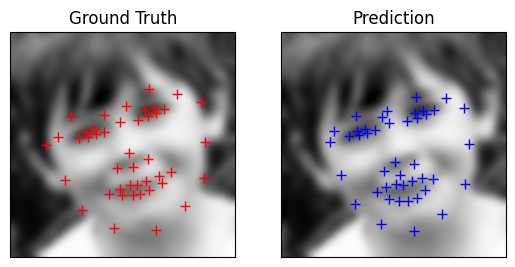

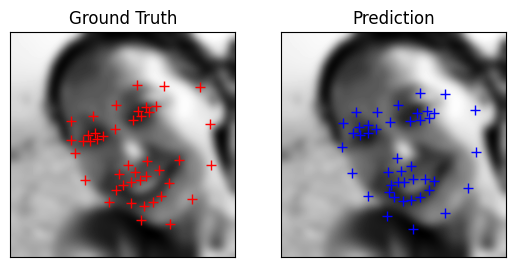

Parameters... 
Image size: 256 
Haussian blur size: 31 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 7.954030666445422
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


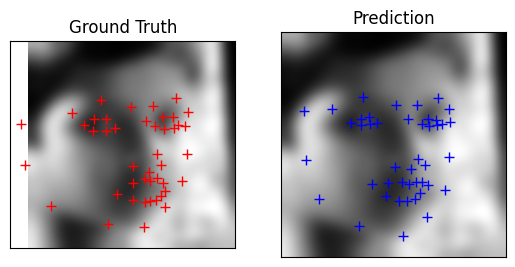

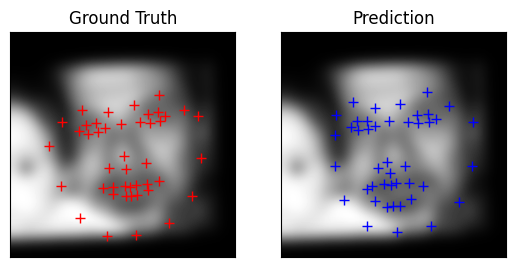

Parameters... 
Image size: 256 
Haussian blur size: 51 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 8.818875212765025
list of means: [6.062685324510649, 6.891943474137444, 5.977217451531367, 7.042082330669301, 6.226814215449626, 6.792815227141994, 7.954030666445422, 8.818875212765025]


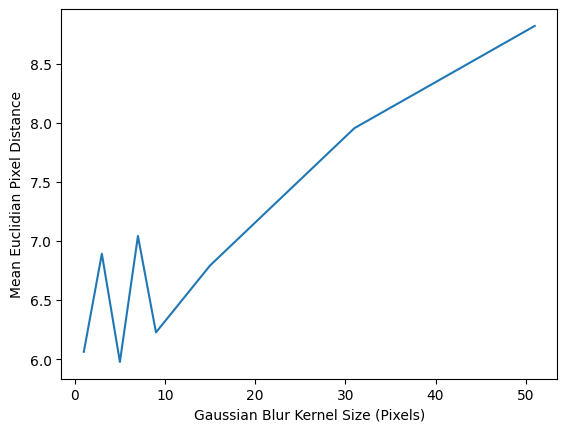

In [ ]:
##trying different gaussian kernel sizes
parameters = [[256,1,8,16,11],[256,3,8,16,1],[256,5,8,16,11],[256,7,8,16,1],[256,9,8,16,11],[256,15,8,16,11],[256,31,8,16,11],[256,51,8,16,11]]
independent_variable = [parameter[1] for parameter in parameters]

dependent_variable = multiple_experiments(parameters)


plt.plot(independent_variable, dependent_variable) 
plt.xlabel("Gaussian Blur Kernel Size (Pixels)")
plt.ylabel("Mean Euclidian Pixel Distance")

plt.show()

preprocessing training & validation Data with scale 1.0


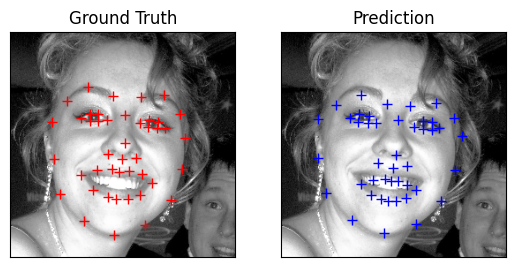

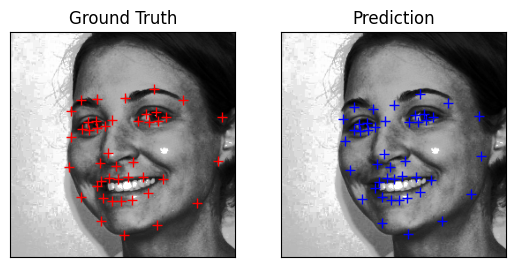

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 64 
Regressor alpha: 11 
Mean Euclidian Distance: 7.7847594850535184
preprocessing training & validation Data with scale 1.0


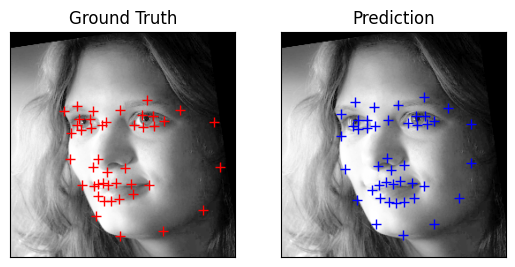

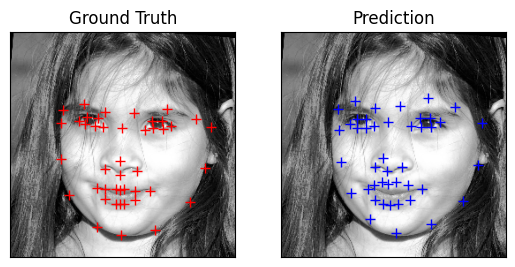

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 48 
Regressor alpha: 11 
Mean Euclidian Distance: 7.144443676545775
preprocessing training & validation Data with scale 1.0


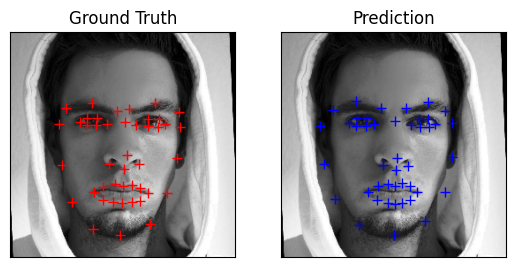

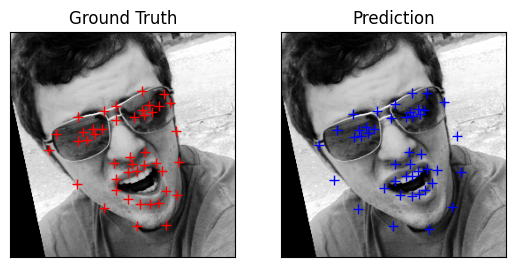

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 11 
Mean Euclidian Distance: 5.9921530264406035
preprocessing training & validation Data with scale 1.0


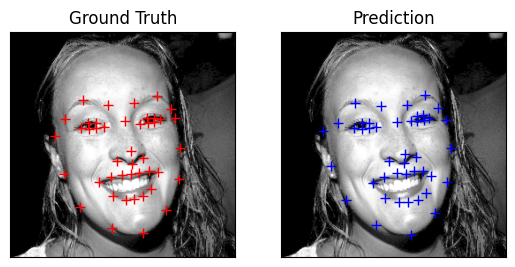

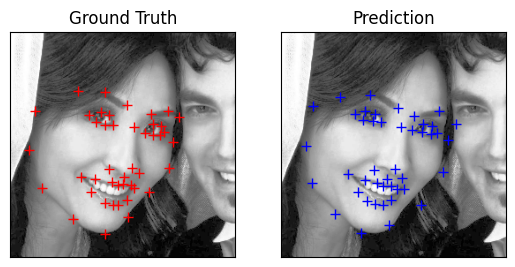

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 16 
Regressor alpha: 11 
Mean Euclidian Distance: 6.119193536185977
preprocessing training & validation Data with scale 1.0


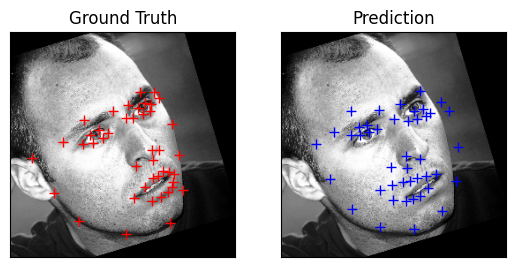

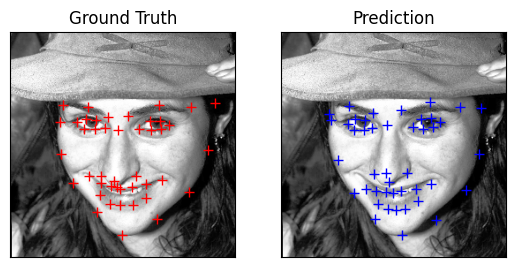

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 8 
Regressor alpha: 11 
Mean Euclidian Distance: 6.3030536684966085
list of means: [7.7847594850535184, 7.144443676545775, 5.9921530264406035, 6.119193536185977, 6.3030536684966085]


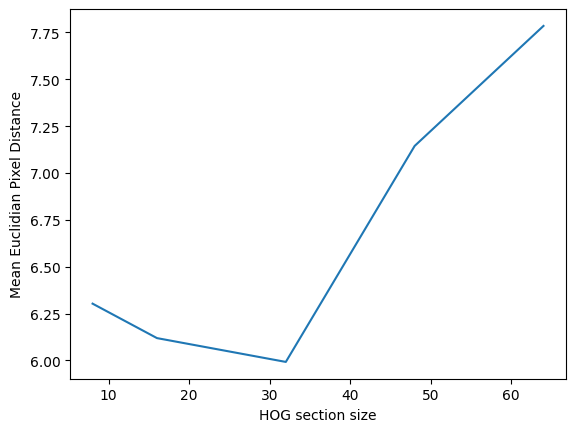

In [ ]:
##trying different HOG piece sizes
parameters = [[256,1,8,64,11],[256,1,8,48,11],[256,1,8,32,11],[256,1,8,16,11],[256,1,8,8,11]]
independent_variable = [(parameter[3]/parameter[0]) for parameter in parameters]

dependent_variable = multiple_experiments(parameters)


plt.plot(independent_variable, dependent_variable) 
plt.xlabel("HOG section size")
plt.ylabel("Mean Euclidian Pixel Distance")

plt.show()

preprocessing training & validation Data with scale 1.0


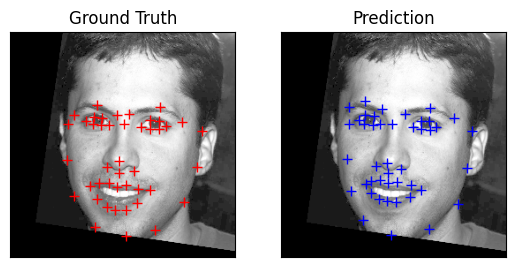

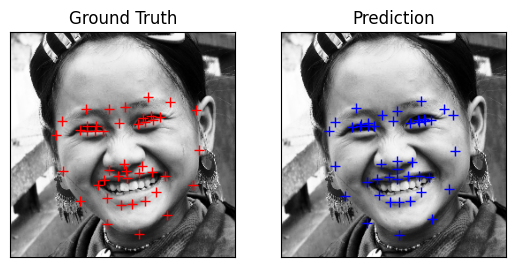

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 1 
Mean Euclidian Distance: 6.487815245144136
preprocessing training & validation Data with scale 1.0


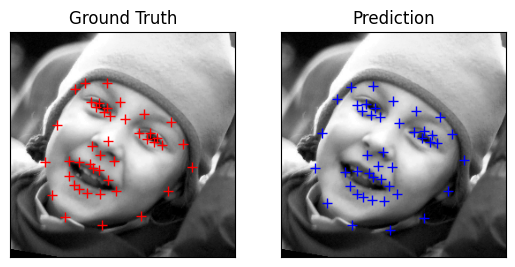

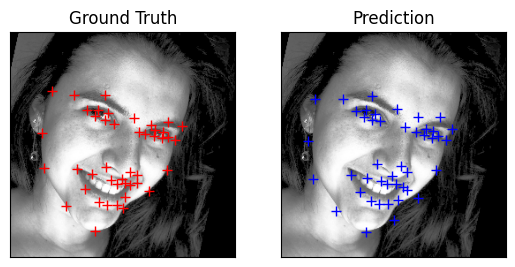

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.918713033993099
preprocessing training & validation Data with scale 1.0


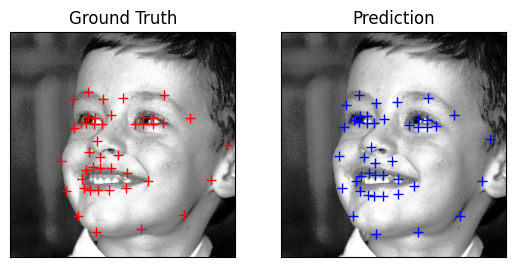

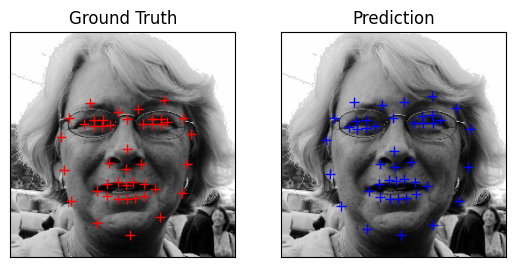

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 25 
Mean Euclidian Distance: 6.0899692426705325
preprocessing training & validation Data with scale 1.0


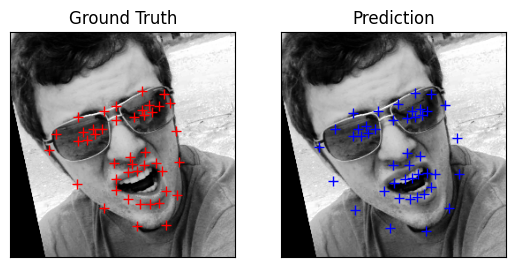

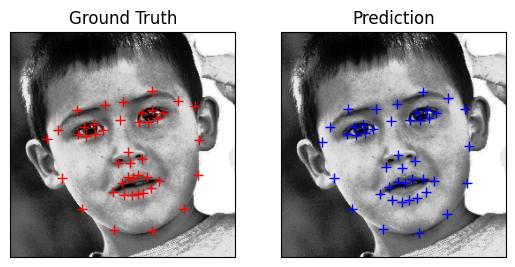

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 50 
Mean Euclidian Distance: 6.263554337854692
preprocessing training & validation Data with scale 1.0


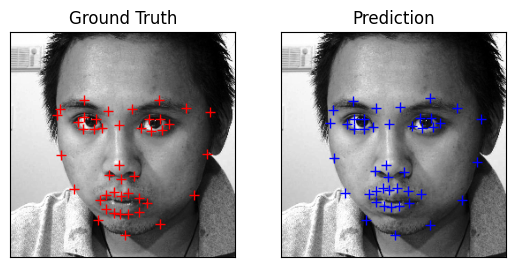

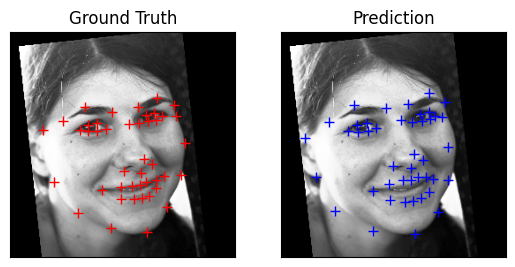

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 100 
Mean Euclidian Distance: 6.516391670839088
preprocessing training & validation Data with scale 1.0


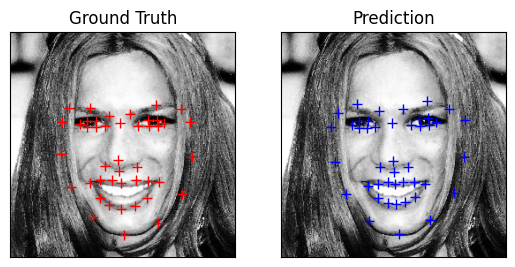

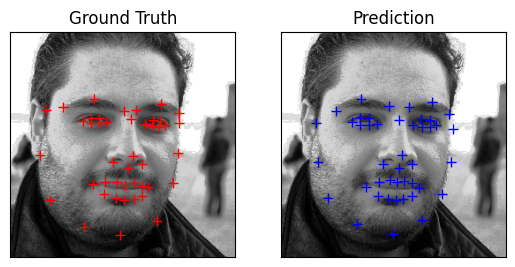

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 200 
Mean Euclidian Distance: 7.429280629499922
preprocessing training & validation Data with scale 1.0


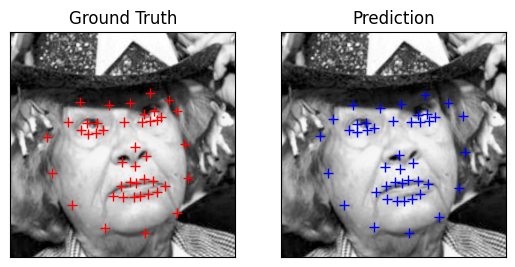

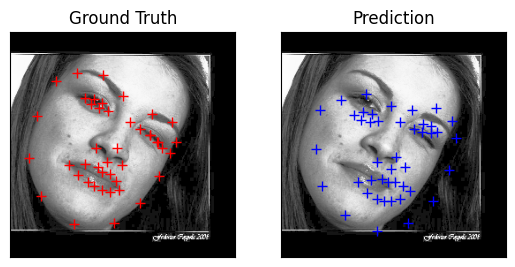

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 300 
Mean Euclidian Distance: 7.711239181078785
preprocessing training & validation Data with scale 1.0


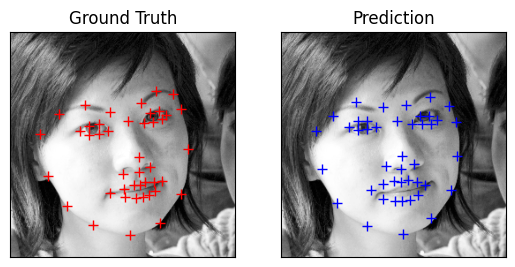

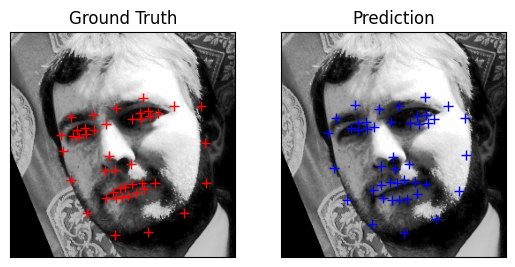

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 500 
Mean Euclidian Distance: 8.919778228971246
list of means: [6.487815245144136, 5.918713033993099, 6.0899692426705325, 6.263554337854692, 6.516391670839088, 7.429280629499922, 7.711239181078785, 8.919778228971246]


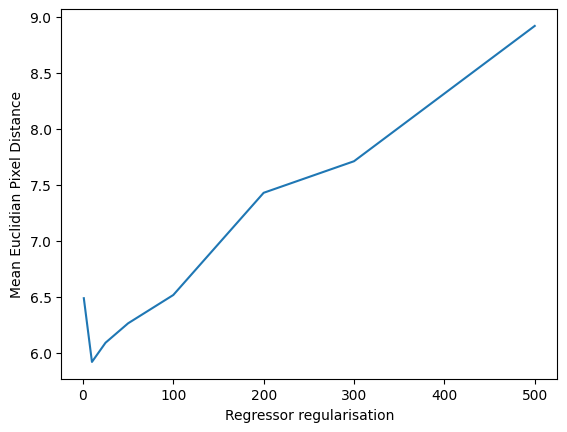

In [ ]:
##trying different regularisation levels
parameters = [[256,1,8,32,1],[256,1,8,32,10],[256,1,8,32,25],[256,1,8,32,50],[256,1,8,32,100],[256,1,8,32,200],[256,1,8,32,300],[256,1,8,32,500]]
independent_variable = [parameter[4] for parameter in parameters]

dependent_variable = multiple_experiments(parameters)


plt.plot(independent_variable, dependent_variable) 
plt.xlabel("Regressor regularisation")
plt.ylabel("Mean Euclidian Pixel Distance")

plt.show()

preprocessing training & validation Data with scale 1.0


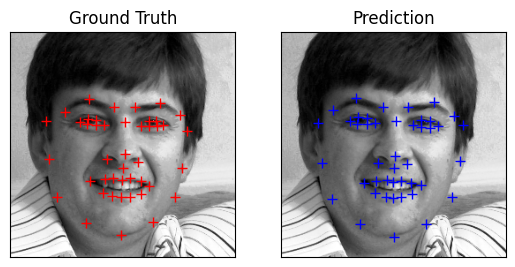

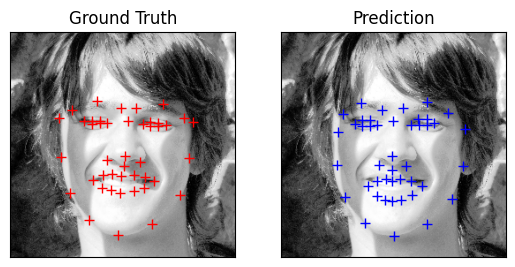

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 4 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 6.28950863596465
preprocessing training & validation Data with scale 1.0


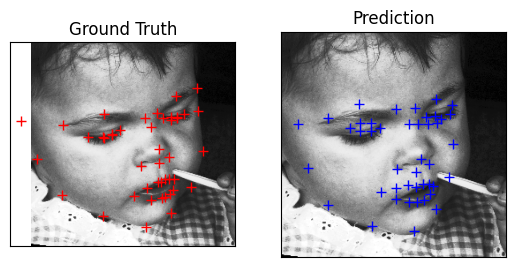

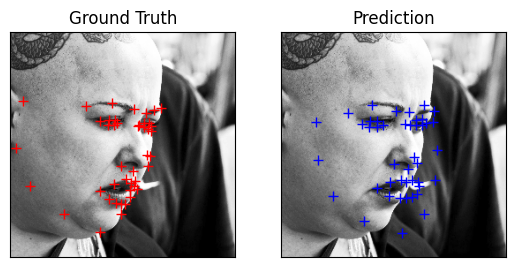

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 6 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 6.014607703341373
preprocessing training & validation Data with scale 1.0


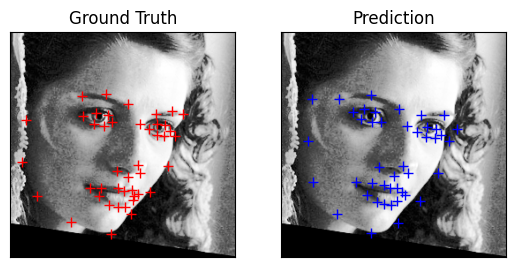

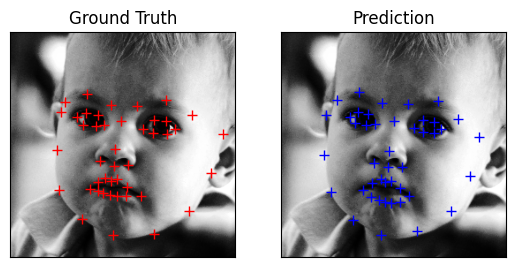

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 8 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 6.065177507193404
preprocessing training & validation Data with scale 1.0


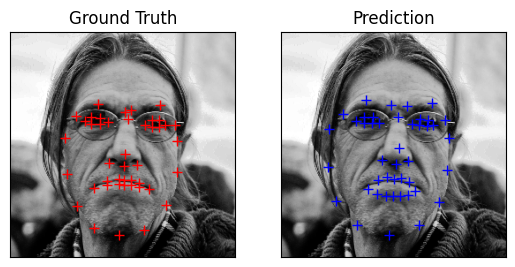

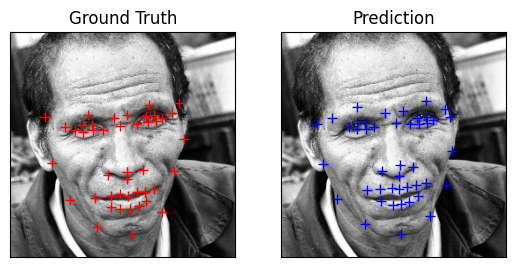

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 10 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.975599978227996
preprocessing training & validation Data with scale 1.0


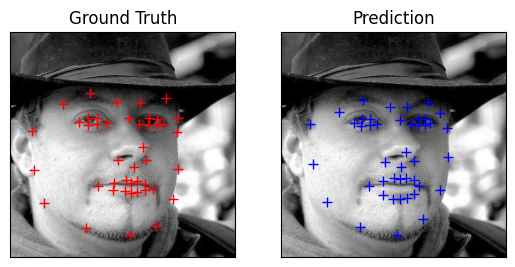

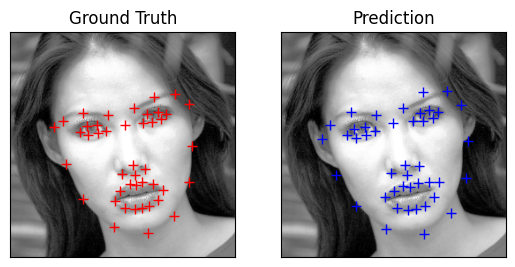

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 12 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.888945969387259
preprocessing training & validation Data with scale 1.0


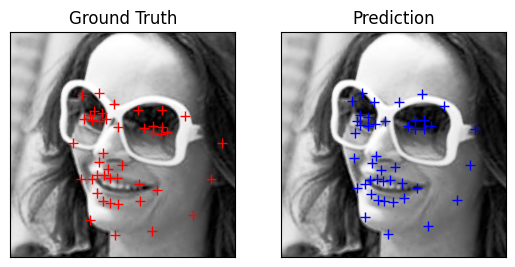

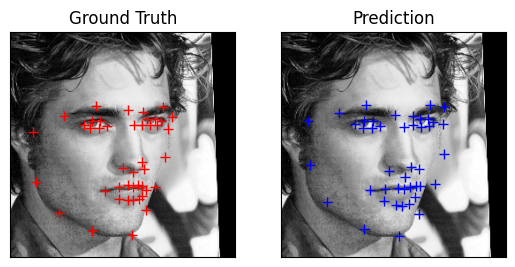

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 16 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.957196187260728
preprocessing training & validation Data with scale 1.0


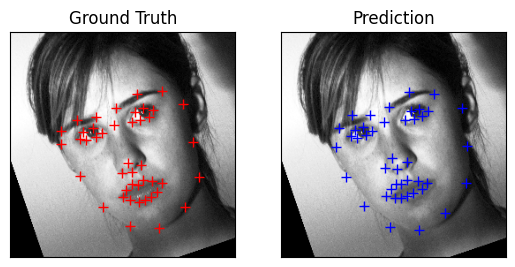

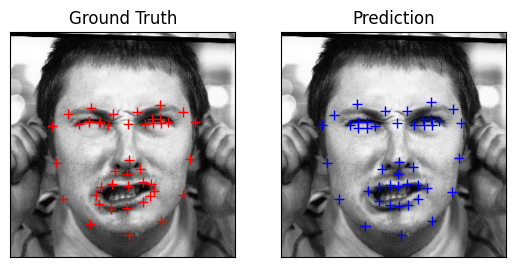

Parameters... 
Image size: 256 
Haussian blur size: 1 
Hog orientation size: 64 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.94283787689401
list of means: [6.28950863596465, 6.014607703341373, 6.065177507193404, 5.975599978227996, 5.888945969387259, 5.957196187260728, 5.94283787689401]


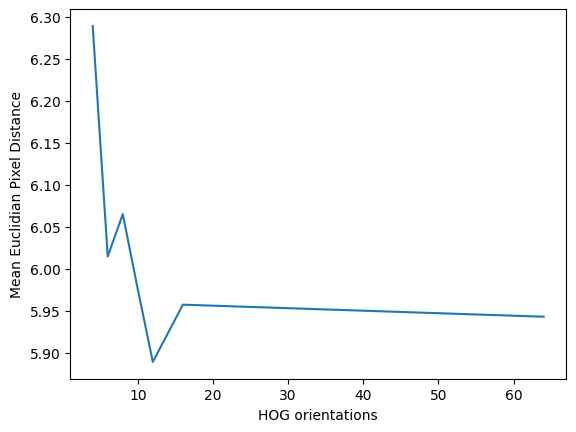

In [ ]:
##trying different hog orientation qty
parameters = [[256,1,4,32,10],[256,1,6,32,10],[256,1,8,32,10],[256,1,10,32,10],[256,1,12,32,10],[256,1,16,32,10],[256,1,64,32,10],]
independent_variable = [parameter[2] for parameter in parameters]

dependent_variable = multiple_experiments(parameters)


plt.plot(independent_variable, dependent_variable) 
plt.xlabel("HOG orientations")
plt.ylabel("Mean Euclidian Pixel Distance")

plt.show()

preprocessing training & validation Data with scale 1.0


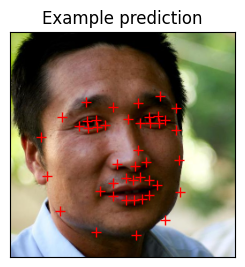

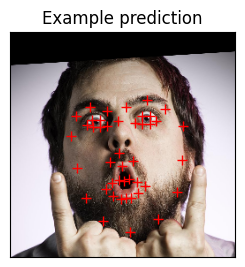

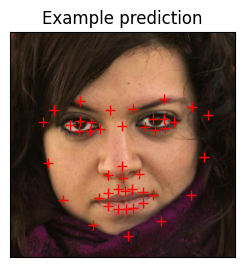

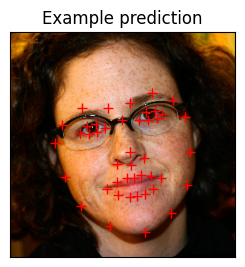

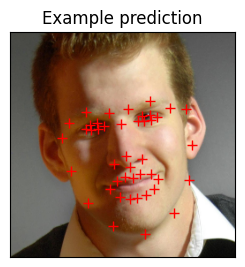

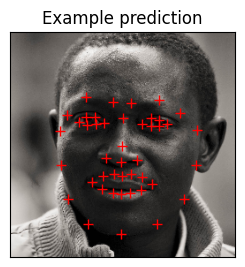

In [ ]:
##doing predictions for test images
predict_test_images(256,5,12,32,10, True) 

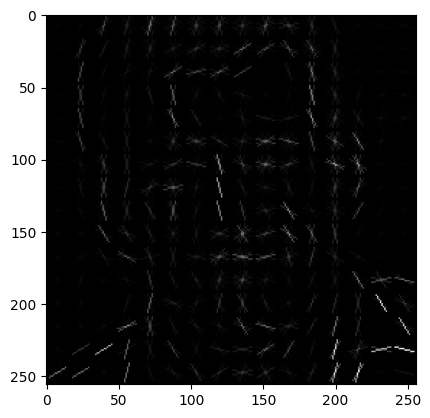

In [ ]:
#walkthrough for preprocessing of 1 test image

image = example_images[4]

image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

hist_eq_img = cv2.equalizeHist(image_grey)

gaussian = cv2.GaussianBlur(hist_eq_img, (5, 5), 0)

data, hog_image = do_hog(gaussian, 8, 16)


preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


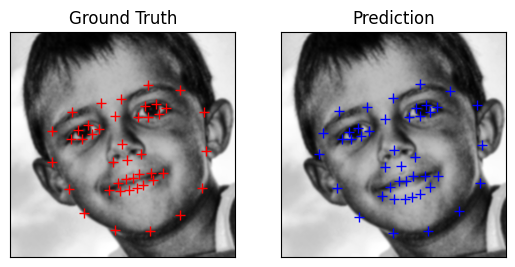

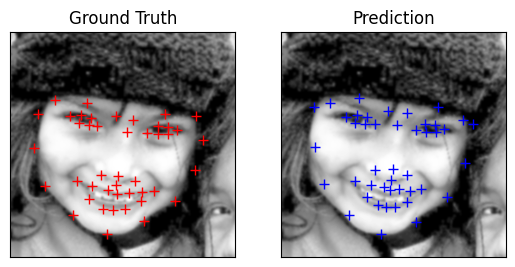

Parameters... 
Image size: 256 
Gaussian blur size: 5 
Hog orientation size: 12 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.79200807557702
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


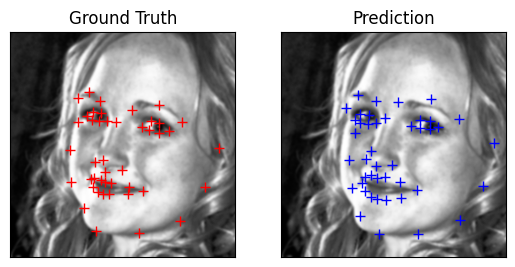

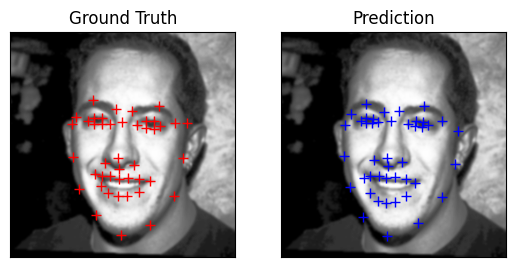

Parameters... 
Image size: 256 
Gaussian blur size: 5 
Hog orientation size: 12 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 6.026343032078251
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


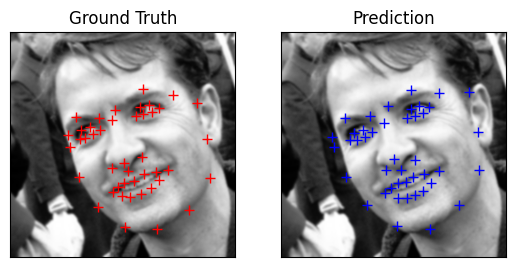

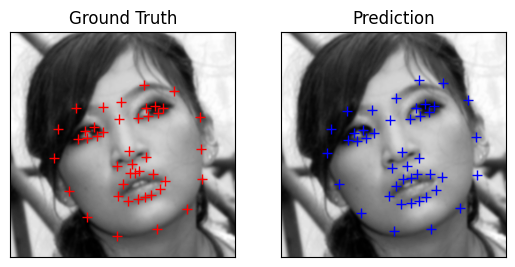

Parameters... 
Image size: 256 
Gaussian blur size: 5 
Hog orientation size: 12 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.880621162342312
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


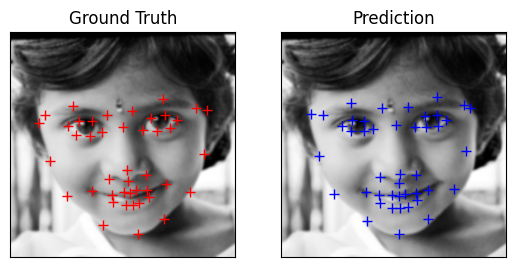

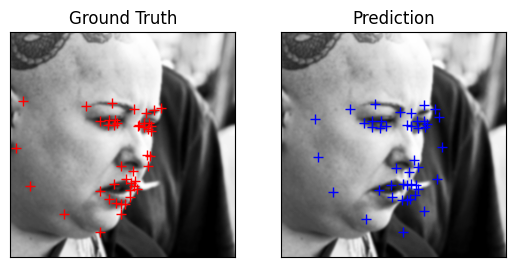

Parameters... 
Image size: 256 
Gaussian blur size: 5 
Hog orientation size: 12 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.962299601611887
preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


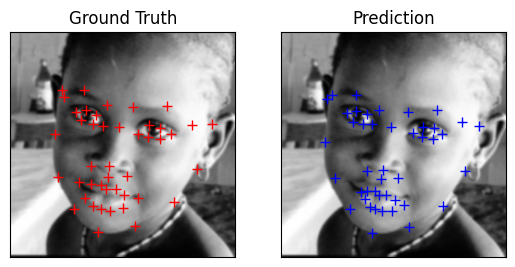

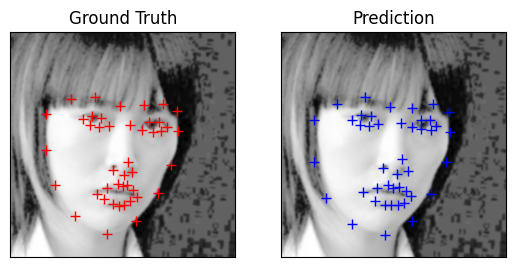

Parameters... 
Image size: 256 
Gaussian blur size: 5 
Hog orientation size: 12 
Hog kernel size: 32 
Regressor alpha: 10 
Mean Euclidian Distance: 5.71417774056531
list of means: [5.79200807557702, 6.026343032078251, 5.880621162342312, 5.962299601611887, 5.71417774056531]


[5.79200807557702,
 6.026343032078251,
 5.880621162342312,
 5.962299601611887,
 5.71417774056531]

In [ ]:
#doing exepriment with same parameters many times to find overall mean of validation set
multiple_experiments([[256,5,12,32,10],[256,5,12,32,10],[256,5,12,32,10],[256,5,12,32,10],[256,5,12,32,10]])

preprocessing training & validation Data with scale 1.0


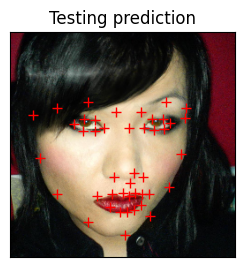

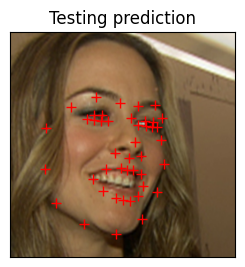

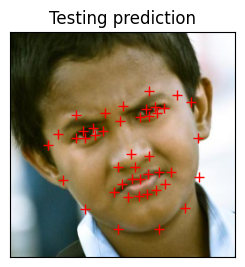

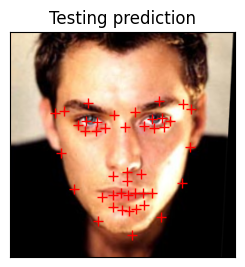

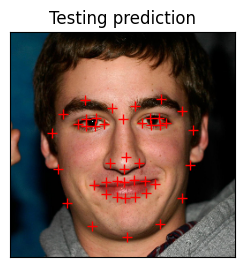

...

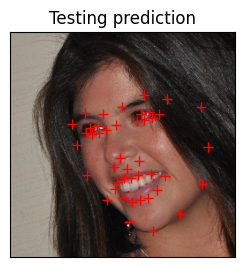

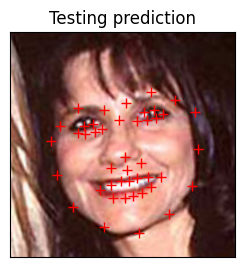

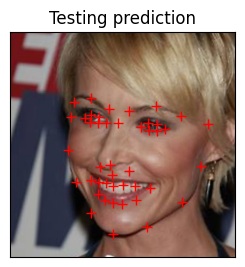

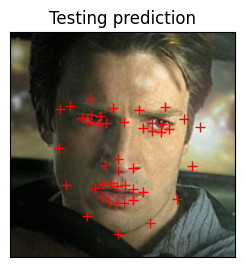

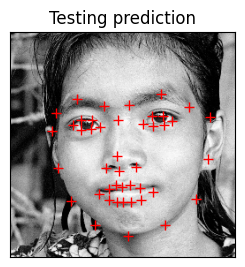

KeyboardInterrupt: ignored

<Figure size 640x480 with 0 Axes>

In [ ]:
"""
image size: 256
gaussian kernel: 5
hog orientations: 12
hog cell size: 32
regressor alphs: 10
"""

preprocessed_training_images, preprocessed_validation_images, preprocessed_training_points, preprocessed_validation_pts, process_scale = preprocess_training_and_validation_data(256, 5)


#adding validation images and points back to training lists to give a larger training dataset for the task. 
preprocessed_training_images.append(preprocessed_validation_images)
preprocessed_training_points.append(preprocessed_validation_pts)


preprocessed_testing_images = preprocess_testing_images(256, 5)

#Get Hogs of training and testing images
training_hogs = [do_hog(image, 12, 32)[0] for image in preprocessed_training_images]
testing_hogs = [do_hog(image, 12, 32)[0] for image in preprocessed_testing_images]


#reshaping coords to be a 2D array instead of 3D
n_samples_pts, n_points, n_coords = preprocessed_training_points.shape
training_pts_flat = np.reshape(preprocessed_training_points, (n_samples_pts, n_points * n_coords))

#create ridge regressor
ridge_regressor = Ridge(alpha=10)
#fit regressor to training data
ridge_regressor.fit(training_hogs, training_pts_flat)

#create testing set coord predictions from hog
testing_predictions_flat = ridge_regressor.predict(np.array(testing_hogs))
  
#reshape test predictions to be 3d for coords
testing_predictions = np.reshape(testing_predictions_flat, (-1, n_points, n_coords))


for i in range(len(testing_predictions)):  
  visualise_pts(test_images[i], testing_predictions[i], colour="gray", point_colour="r", subplot=(1, 2, 1))
  plt.title("Testing prediction")
  ax = plt.gca()
  ax.get_xaxis().set_visible(False)
  ax.get_yaxis().set_visible(False)
  plt.show()

preprocessing training & validation Data with scale 1.0
preprocessing done...
HOGs calculated


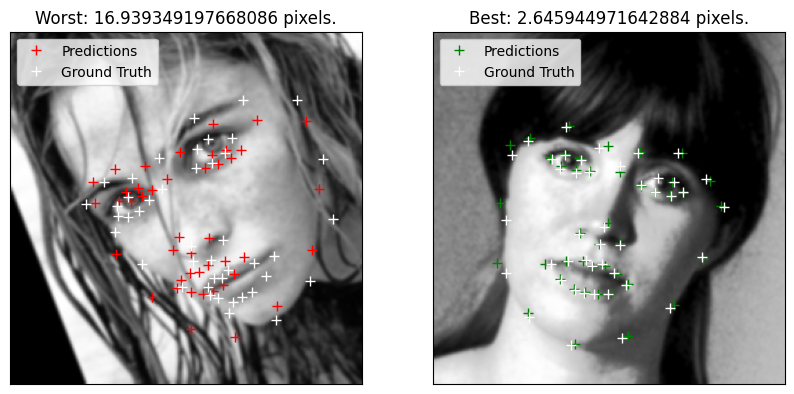

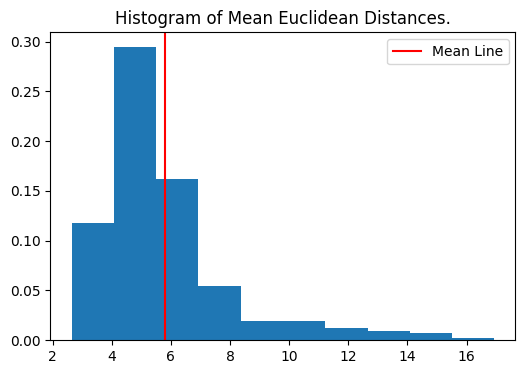

5.814311545647096


In [11]:
# Preprocess images uding preprocessing function
preprocessed_training_images, preprocessed_validation_images, preprocessed_training_points, preprocessed_validation_pts, process_scale = preprocess_training_and_validation_data(256, 5)

print("preprocessing done...")
#Get Hogs of training and validation Data
training_hogs = [do_hog(image, 12, 32)[0] for image in preprocessed_training_images]
validation_hogs = [do_hog(image, 12, 32)[0] for image in preprocessed_validation_images]
print("HOGs calculated")
#reshaping coords to be a 2D array instead of 3D
n_samples_pts, n_points, n_coords = preprocessed_training_points.shape
training_pts_flat = np.reshape(preprocessed_training_points, (n_samples_pts, n_points * n_coords))
  
#create ridge regressor
ridge_regressor = Ridge(alpha=10)
#fit regressor to training data
ridge_regressor.fit(training_hogs, training_pts_flat)

#create validation set coord predictions from hog
validation_predictions_flat = ridge_regressor.predict(np.array(validation_hogs))
#reshape validation predictions to be 3d for coords
validation_predictions = np.reshape(validation_predictions_flat, (-1, n_points, n_coords))
mean_distance = find_mean_euclid_dist(grounds=preprocessed_validation_pts, predicts=validation_predictions, preprocess_scale=1)
plot_best_and_worst(preprocessed_validation_pts, validation_predictions, preprocessed_validation_images)
print(mean_distance)

In [ ]:
save_as_csv(points=testing_predictions)

#Extension Task



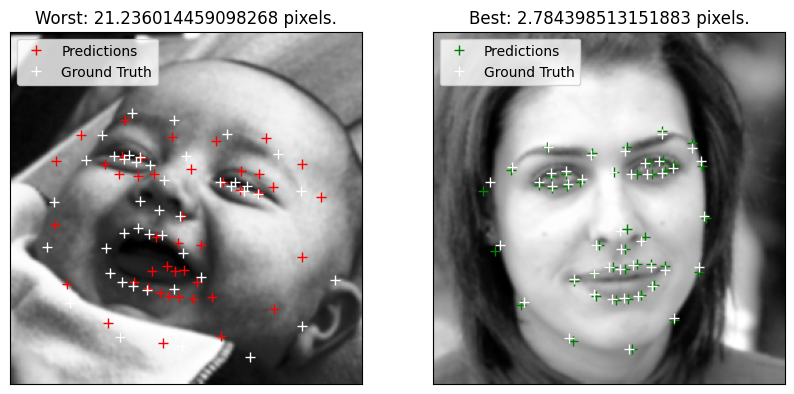

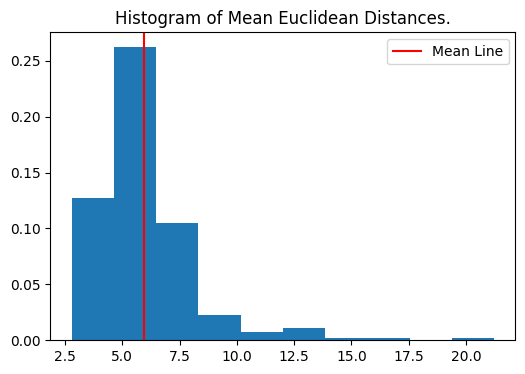

In [104]:
#redo hog function to get rid of visualise.
def do_hog(image, hog_orientations, hog_size):
  features = hog(image, orientations=hog_orientations, pixels_per_cell=(hog_size,hog_size), visualize=True)
  return features


#apply greyscale and histogram equalisation to images
train_images_subset_equalised = []
for image in images_subset:
  image_grey = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  hist_eq_img = cv2.equalizeHist(image_grey)
  train_images_subset_equalised.append(hist_eq_img)

#apply gaussian blur to images
train_images_subset_gaussian = []
for image in train_images_subset_equalised:
  train_images_subset_gaussian.append(cv2.GaussianBlur(image, (5, 5), 0))


#rename variable for ease of use
preprocessed_subset_images = train_images_subset_gaussian


#do hog on training data subset.
hogged_subset_train = [do_hog(image, 12, 32)[0] for image in preprocessed_subset_images]


#reshape data to train model
n_samples_pts, n_points, n_coords = pts_subset.shape
pts_subset_train_flat = np.reshape(pts_subset, (n_samples_pts, n_points * n_coords))


#create first ridge regressor
subset_ridge_regressor = Ridge(alpha=10)
subset_ridge_regressor.fit(hogged_subset_train, pts_subset_train_flat)

##First Model Trained.##



# split data again
preprocessed_training_images, preprocessed_validation_images, preprocessed_training_points, preprocessed_validation_pts, process_scale = preprocess_training_and_validation_data(256, 5)

#do hogs on new data
training_hogs = [do_hog(image, 12, 32)[0] for image in preprocessed_training_images]
validation_hogs = [do_hog(image, 12, 32)[0] for image in preprocessed_validation_images]

#run training images through 1st regressor to extract subpoints
subset_point_training_2nd_regressor = subset_ridge_regressor.predict(np.array(training_hogs))


#create second regressor
second_regressor = Ridge(alpha=10)

#reshape 44 validation pts to be 1d
n_samples_pts, n_points, n_coords = preprocessed_training_points.shape
second_training_pts_flat = np.reshape(preprocessed_training_points, (n_samples_pts, n_points * n_coords))

#train second regressor on 5 points from first regressor.
second_regressor.fit(subset_point_training_2nd_regressor, second_training_pts_flat)

#Second Model Trained


#predict validation 5 points from images
subset_point_validation_2nd_regressor = subset_ridge_regressor.predict(np.array(validation_hogs))
#predict all validation points from images.
whole_validation_predictions_flat = second_regressor.predict(np.array(subset_point_validation_2nd_regressor))

#reshape predictions to be 2d
val_preds = np.reshape(whole_validation_predictions_flat, (-1, n_points, n_coords))


mean_distance = find_mean_euclid_dist(grounds=preprocessed_validation_pts, predicts=val_preds, preprocess_scale=1)
print(mean_distance)

#plots best and predictions, as well as a histogram of the mean euclid distances for the validation set
plot_best_and_worst(preprocessed_validation_pts, val_preds, preprocessed_validation_images)